In [1]:
import anndata as ad
import pandas as pd
import numpy as np
import MINGLE as mg
import seaborn as sns
import matplotlib.pyplot as plt

/opt/anaconda3/lib/python3.13/site-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/opt/anaconda3/lib/python3.13/site-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/opt/anaconda3/lib/python3.13/site-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):


In [2]:
file_path = r"/Volumes/data/MINGLE/Data/Intestine/05_25_HuBMAP_tunit.csv"
cells = mg.pp.read_file(file_path)

/Users/jamesw/MINGLE_scverse/MINGLE/src/MINGLE/pp/preprocessing.py:33: DtypeWarning: Columns (62,63,70) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(path)
/opt/anaconda3/lib/python3.13/functools.py:934: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)


In [3]:
cells.obs

,Unnamed: 0,MUC2,SOX9,MUC1,CD31,Synapto,CD49f,CD15,CHGA,CDX2,...,machine,MUC6,Neighborhood,Neighborhood_Ind,Neigh_sub,NeighInd_sub,Community,Major Community,Tissue Segment,Tissue Unit
0,0,-0.303994,-0.163727,-0.587608,-0.212903,0.164173,-0.664863,0.049305,0.003616,-0.377532,...,NaN,NaN,Mature Epithelial,Mature Epithelial,Epithelial,Epithelial,Plasma Cell Enriched,Immune,Mucosa,Mucosa
1,1,-0.301927,-0.491706,-0.500804,-0.243205,-0.142568,-0.664861,-0.182627,-0.117573,-0.182754,...,NaN,NaN,Transit Amplifying Zone,Mature Epithelial,Epithelial,Epithelial,Mature Epithelial,Epithelial,Mucosa,Mucosa
2,2,-0.302206,-0.547234,-0.510705,-0.235309,-0.217185,-0.622758,-0.296486,-0.091504,-0.268055,...,NaN,NaN,Innate Immune Enriched,Innate Immune Enriched,Immune,Immune,Innate Immune Enriched,Immune,Mucosa,Mucosa
3,3,-0.294644,-0.615593,-0.570580,-0.247548,-0.042246,-0.642230,-0.299031,-0.121458,-0.377533,...,NaN,NaN,Outer Follicle,Outer Follicle,Immune,Immune,Follicle,Immune,Mucosa,Mucosa
4,4,-0.298609,-0.272162,-0.587607,-0.228376,-0.266695,-0.664864,-0.237499,-0.121460,-0.168489,...,NaN,NaN,Outer Follicle,Outer Follicle,Immune,Immune,Follicle,Immune,Mucosa,Mucosa
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2511997,2603100,0.251624,-0.360296,-0.254984,-0.229060,0.154796,-0.218688,-0.350372,-0.112132,-0.142597,...,Skywalker,NaN,Innervated Stroma,Innervated Smooth Muscle,Stromal,Stromal,Stroma,Stroma,Subucosa,Muscularis externa
2511998,2603101,-0.274299,-0.465097,-0.367546,-0.210402,-0.204488,-0.259962,-0.333110,-0.103590,-0.213387,...,Skywalker,NaN,Stroma,Stroma,Stromal,Stromal,Stroma,Stroma,Subucosa,Muscularis externa
2511999,2603102,-0.260292,-0.397157,-0.352751,-0.200957,0.427470,-0.061012,-0.363492,-0.109572,-0.172711,...,Skywalker,NaN,Stroma,Smooth Muscle,Stromal,Stromal,Stroma,Stroma,Subucosa,Muscularis externa
2512000,2603103,-0.073782,-0.020896,-0.365204,-0.102411,-0.218278,-0.266579,-0.337989,-0.103707,-0.072134,...,Skywalker,NaN,Microvasculature,Microvasculature,Stromal,Stromal,Stroma,Stroma,Subucosa,Muscularis externa


In [4]:
cluster_col = "Community"
neighborhood_col = "Tissue Unit"
region_key = "unique_region"

In [5]:
window = mg.tl.KNN2(cells, cluster_col=cluster_col,region_key=region_key)

Example dummy cols: ['Community__Adaptive Immune Enriched', 'Community__CD66+ Mature Epithelial', 'Community__CD8+ T Enriched IEL', 'Community__Follicle', 'Community__Innate Immune Enriched']


In [6]:
window[300]

/opt/anaconda3/lib/python3.13/site-packages/pandas/io/formats/format.py:1458: RuntimeWarning: overflow encountered in cast
  has_large_values = (abs_vals > 1e6).any()


,x,y,unique_region,Community,Adaptive Immune Enriched,CD66+ Mature Epithelial,CD8+ T Enriched IEL,Follicle,Innate Immune Enriched,Mature Epithelial,Plasma Cell Enriched,Secretory Epithelial,Smooth Muscle,Stroma
0,3984.0,3387.0,B004_Ascending,Plasma Cell Enriched,11.0,22.0,0.0,0.0,0.0,5.0,242.0,20.0,0.0,0.0
1,5188.0,4116.0,B004_Ascending,Mature Epithelial,0.0,0.0,0.0,0.0,0.0,60.0,240.0,0.0,0.0,0.0
2,6070.0,3146.0,B004_Ascending,Innate Immune Enriched,50.0,0.0,0.0,0.0,26.0,0.0,0.0,18.0,91.0,115.0
3,6792.0,3891.0,B004_Ascending,Follicle,8.0,0.0,0.0,176.0,6.0,0.0,56.0,41.0,0.0,13.0
4,7968.0,6351.0,B004_Ascending,Follicle,0.0,0.0,0.0,300.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2511997,7633.0,353.0,B008_Trans,Stroma,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,250.0,50.0
2511998,4921.0,533.0,B008_Trans,Stroma,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,297.0,3.0
2511999,3710.0,6049.0,B008_Trans,Stroma,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,199.0,101.0
2512000,5823.0,794.0,B008_Trans,Stroma,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,228.0,72.0


In [7]:
centroids = mg.tl.centroid_Calculation(cells, k = 300, cluster_col=cluster_col, neighborhood_col=neighborhood_col, region_col=region_key)

Example dummy cols: ['Community__Adaptive Immune Enriched', 'Community__CD66+ Mature Epithelial', 'Community__CD8+ T Enriched IEL', 'Community__Follicle', 'Community__Innate Immune Enriched']


/opt/anaconda3/lib/python3.13/site-packages/pandas/io/formats/format.py:1458: RuntimeWarning: overflow encountered in cast
  has_large_values = (abs_vals > 1e6).any()
/opt/anaconda3/lib/python3.13/site-packages/pandas/io/formats/format.py:1458: RuntimeWarning: overflow encountered in cast
  has_large_values = (abs_vals > 1e6).any()
/opt/anaconda3/lib/python3.13/site-packages/pandas/io/formats/format.py:1458: RuntimeWarning: overflow encountered in cast
  has_large_values = (abs_vals > 1e6).any()
/opt/anaconda3/lib/python3.13/site-packages/pandas/io/formats/format.py:1458: RuntimeWarning: overflow encountered in cast
  has_large_values = (abs_vals > 1e6).any()


{5:               x       y   unique_region               Community  \
0        3984.0  3387.0  B004_Ascending    Plasma Cell Enriched   
1        5188.0  4116.0  B004_Ascending       Mature Epithelial   
2        6070.0  3146.0  B004_Ascending  Innate Immune Enriched   
3        6792.0  3891.0  B004_Ascending                Follicle   
4        7968.0  6351.0  B004_Ascending                Follicle   
...         ...     ...             ...                     ...   
2511997  7633.0   353.0      B008_Trans                  Stroma   
2511998  4921.0   533.0      B008_Trans                  Stroma   
2511999  3710.0  6049.0      B008_Trans                  Stroma   
2512000  5823.0   794.0      B008_Trans                  Stroma   
2512001  2097.0  3363.0      B008_Trans                  Stroma   

         Adaptive Immune Enriched  CD66+ Mature Epithelial  \
0                             0.0                      0.0   
1                             0.0                      0.0   
2    

In [8]:
for _, i in centroids.to_df().iterrows():
    print("here",_)
    print(i)

here Mucosa
Plasma Cell Enriched_mean        82.852776
Plasma Cell Enriched_std         93.929192
Mature Epithelial_mean           23.802271
Mature Epithelial_std            59.662151
Innate Immune Enriched_mean      18.757309
Innate Immune Enriched_std       39.361233
Follicle_mean                    17.209381
Follicle_std                     61.005497
Adaptive Immune Enriched_mean    30.856649
Adaptive Immune Enriched_std     54.694138
Secretory Epithelial_mean        73.473434
Secretory Epithelial_std         87.860252
CD66+ Mature Epithelial_mean      8.668522
CD66+ Mature Epithelial_std      36.214153
CD8+ T Enriched IEL_mean         39.152294
CD8+ T Enriched IEL_std          79.161011
Stroma_mean                       2.470365
Stroma_std                       12.079474
Smooth Muscle_mean                2.757013
Smooth Muscle_std                12.889174
Name: Mucosa, dtype: float64
here Muscularis mucosa
Plasma Cell Enriched_mean        36.634697
Plasma Cell Enriched_std         

In [35]:
centroids_df = pd.DataFrame(
    centroids.X.toarray() if hasattr(centroids.X, "toarray") else centroids.X,
    index=centroids.obs_names,
    columns=centroids.var_names
)
centroids_df = centroids_df.reset_index()
centroids_df

,Tissue Unit,Plasma Cell Enriched_mean,Plasma Cell Enriched_std,Mature Epithelial_mean,Mature Epithelial_std,Innate Immune Enriched_mean,Innate Immune Enriched_std,Follicle_mean,Follicle_std,Adaptive Immune Enriched_mean,...,Secretory Epithelial_mean,Secretory Epithelial_std,CD66+ Mature Epithelial_mean,CD66+ Mature Epithelial_std,CD8+ T Enriched IEL_mean,CD8+ T Enriched IEL_std,Stroma_mean,Stroma_std,Smooth Muscle_mean,Smooth Muscle_std
0,Mucosa,82.852776,93.929192,23.802271,59.662151,18.757309,39.361233,17.209381,61.005497,30.856649,...,73.473434,87.860252,8.668522,36.214153,39.152294,79.161011,2.470365,12.079474,2.757013,12.889174
1,Muscularis mucosa,36.634697,62.464935,5.027577,20.571335,21.310543,41.937008,9.682218,34.798740,87.843353,...,54.961330,65.819130,0.605732,7.331355,16.476696,47.818531,21.986067,33.027935,45.471786,52.902142
2,Submucosa,1.118688,6.724429,0.734919,7.936018,6.791834,22.792553,2.954167,18.439562,11.559978,...,7.080599,26.012409,0.372577,5.421519,0.689548,6.214407,226.738037,72.309074,41.959652,52.873417
3,Muscularis externa,0.140962,2.515944,0.125520,2.567932,2.042076,11.418814,0.120992,2.696232,0.702181,...,0.204918,3.009742,0.010504,0.612414,0.046438,1.149235,18.329895,31.960695,278.276520,36.209312


In [10]:
centroids_df = centroids.to_df()
print(centroids_df.index[:10])
print(centroids_df.index.map(type).value_counts())
print(centroids_df.index.duplicated().sum())

Index(['Mucosa', 'Muscularis mucosa', 'Submucosa', 'Muscularis externa'], dtype='object', name='Tissue Unit')
Tissue Unit
<class 'str'>    4
Name: count, dtype: int64
0


In [11]:
mg.tl.cpu_gmm_probability(CELLS_ADATA=cells, CENTROIDS_ADATA=centroids, cluster_col=cluster_col, neighborhood_col=neighborhood_col, region_key=region_key, ks=(10, 20, 100, 300), k = 300)

Example dummy cols: ['Community__Adaptive Immune Enriched', 'Community__CD66+ Mature Epithelial', 'Community__CD8+ T Enriched IEL', 'Community__Follicle', 'Community__Innate Immune Enriched']
Using 14 processes.


/opt/anaconda3/lib/python3.13/site-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/opt/anaconda3/lib/python3.13/site-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/opt/anaconda3/lib/python3.13/site-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/opt/anaconda3/lib/python3.13/site-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/opt/anaconda3/lib/python3.13/site-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprec

AnnData object with n_obs × n_vars = 2512002 × 0
    obs: 'Unnamed: 0', 'MUC2', 'SOX9', 'MUC1', 'CD31', 'Synapto', 'CD49f', 'CD15', 'CHGA', 'CDX2', 'ITLN1', 'CD4', 'CD127', 'Vimentin', 'HLADR', 'CD8', 'CD11c', 'CD44', 'CD16', 'BCL2', 'CD3', 'CD123', 'CD38', 'CD90', 'aSMA', 'CD21', 'NKG2D', 'CD66', 'CD57', 'CD206', 'CD68', 'CD34', 'aDef5', 'CD7', 'CD36', 'CD138', 'CD45RO', 'Cytokeratin', 'CD117', 'CD19', 'Podoplanin', 'CD45', 'CD56', 'CD69', 'Ki67', 'CD49a', 'CD163', 'CD161', 'first_index', 'x', 'y', 'tissue', 'donor', 'region', 'OLFM4', 'FAP', 'CD25', 'CollIV', 'CK7', 'Xcorr', 'Ycorr', 'unique_region', 'neigh_name', 'neigh_sub1', 'Preservation_method', 'Tissue_location', 'array', 'Cell Type', 'Cell Type em', 'Cell subtype', 'machine', 'MUC6', 'Neighborhood', 'Neighborhood_Ind', 'Neigh_sub', 'NeighInd_sub', 'Community', 'Major Community', 'Tissue Segment', 'Tissue Unit'
    uns: 'neighborhood_probability_neighborhoods'
    obsm: 'neighborhood_probabilities'

In [24]:
mg.tl.findPositives(cells)

AnnData object with n_obs × n_vars = 2512002 × 0
    obs: 'Unnamed: 0', 'MUC2', 'SOX9', 'MUC1', 'CD31', 'Synapto', 'CD49f', 'CD15', 'CHGA', 'CDX2', 'ITLN1', 'CD4', 'CD127', 'Vimentin', 'HLADR', 'CD8', 'CD11c', 'CD44', 'CD16', 'BCL2', 'CD3', 'CD123', 'CD38', 'CD90', 'aSMA', 'CD21', 'NKG2D', 'CD66', 'CD57', 'CD206', 'CD68', 'CD34', 'aDef5', 'CD7', 'CD36', 'CD138', 'CD45RO', 'Cytokeratin', 'CD117', 'CD19', 'Podoplanin', 'CD45', 'CD56', 'CD69', 'Ki67', 'CD49a', 'CD163', 'CD161', 'first_index', 'x', 'y', 'tissue', 'donor', 'region', 'OLFM4', 'FAP', 'CD25', 'CollIV', 'CK7', 'Xcorr', 'Ycorr', 'unique_region', 'neigh_name', 'neigh_sub1', 'Preservation_method', 'Tissue_location', 'array', 'Cell Type', 'Cell Type em', 'Cell subtype', 'machine', 'MUC6', 'Neighborhood', 'Neighborhood_Ind', 'Neigh_sub', 'NeighInd_sub', 'Community', 'Major Community', 'Tissue Segment', 'Tissue Unit', 'Count_Above_Threshold'
    uns: 'neighborhood_probability_neighborhoods'
    obsm: 'neighborhood_probabilities'

In [25]:
cells.obsm['neighborhood_probabilities']

array([[9.99396132e-001, 6.03867949e-004, 3.56392297e-280,
        0.00000000e+000],
       [9.98781955e-001, 1.21804527e-003, 5.05350803e-284,
        0.00000000e+000],
       [5.81744206e-033, 6.17458547e-005, 9.99938254e-001,
        3.26652738e-028],
       ...,
       [1.32602127e-073, 2.75544084e-011, 8.84154360e-007,
        9.99999116e-001],
       [8.63340299e-084, 9.24969064e-013, 2.36134999e-009,
        9.99999998e-001],
       [7.02701645e-075, 1.37888419e-011, 2.05650018e-007,
        9.99999794e-001]])

In [14]:
cells.write_h5ad("intestine_tu_results.h5ad", compression="gzip")

In [15]:
cells = ad.read_h5ad("intestine_tu_results.h5ad")

In [41]:
df_probabilities = pd.DataFrame(
    cells.obsm["neighborhood_probabilities"],
    index=cells.obs_names,  # restores cell index
    columns=cells.uns["neighborhood_probability_neighborhoods"]
)
cosl = ['unique_region', 'x','y']
for i in cosl:
    df_probabilities[i] = cells.obs[i]
df_probabilities

,Mucosa,Muscularis mucosa,Submucosa,Muscularis externa,unique_region,x,y
0,9.993961e-01,6.038679e-04,3.563923e-280,0.000000e+00,B004_Ascending,3984.0,3387.0
1,9.987820e-01,1.218045e-03,5.053508e-284,0.000000e+00,B004_Ascending,5188.0,4116.0
2,5.817442e-33,6.174585e-05,9.999383e-01,3.266527e-28,B004_Ascending,6070.0,3146.0
3,9.988328e-01,1.167209e-03,9.967050e-31,0.000000e+00,B004_Ascending,6792.0,3891.0
4,1.000000e+00,8.285584e-11,4.589704e-50,0.000000e+00,B004_Ascending,7968.0,6351.0
...,...,...,...,...,...,...,...
2511997,3.137859e-94,9.158124e-14,5.146858e-11,1.000000e+00,B008_Trans,7633.0,353.0
2511998,2.266661e-124,1.398064e-15,1.003787e-13,1.000000e+00,B008_Trans,4921.0,533.0
2511999,1.326021e-73,2.755441e-11,8.841544e-07,9.999991e-01,B008_Trans,3710.0,6049.0
2512000,8.633403e-84,9.249691e-13,2.361350e-09,1.000000e+00,B008_Trans,5823.0,794.0


In [27]:
filtered_cells = cells.obs
filtered_probabilities_df = df_probabilities

plot i

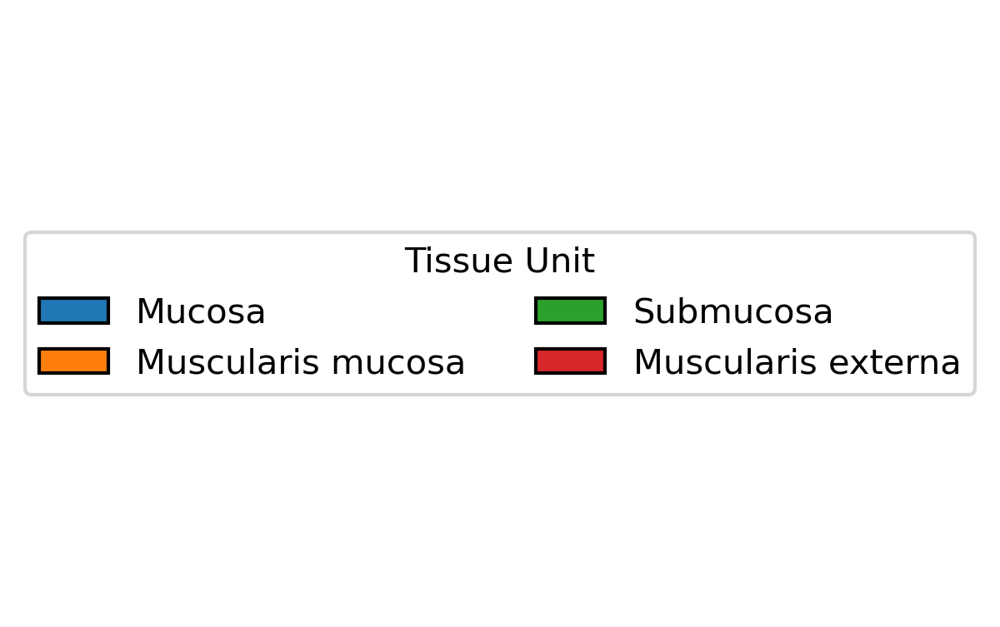

In [28]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import seaborn as sns
 
# Step 1: Retrieve assigned neighborhoods and probabilities
assigned_neighborhoods = filtered_cells['Tissue Unit']
 
assigned_probabilities = filtered_probabilities_df.reindex(filtered_cells.index).apply(
    lambda row: row[filtered_cells.loc[row.name, 'Tissue Unit']], axis=1
)
 
# Step 2: Create visualization dataframe
visualization_df = pd.DataFrame({
    'x': filtered_cells['x'],
    'y': filtered_cells['y'],
    'assigned_tissueunit': assigned_neighborhoods,
    'assigned_probability': assigned_probabilities,
    'unique_region': filtered_cells['unique_region']
})
 
# Step 3: Filter for region
desired_region = 'B008_Sigmoid'
filtered_region_df = visualization_df[visualization_df['unique_region'] == desired_region]
 
# Step 4: Assign colors to neighborhoods
unique_neigh = filtered_region_df['assigned_tissueunit'].unique()
neighborhood_palette = sns.color_palette("tab10", len(unique_neigh))
neigh_to_color = {neigh: neighborhood_palette[i] for i, neigh in enumerate(unique_neigh)}
 
# --- Main Plot (no legend, no axes) ---
plt.figure(figsize=(12, 12), dpi=600)
plt.scatter(
    filtered_region_df['x'], filtered_region_df['y'],
    c=filtered_region_df['assigned_tissueunit'].astype(str).map(neigh_to_color),
    alpha=1, s=5
)
plt.axis('off')
plt.tight_layout()
plt.show()
 
# --- Separate Legend Figure (patch style) ---
legend_elements = [
    Patch(facecolor=color, edgecolor="black", label=label)
    for label, color in neigh_to_color.items()
]
 
fig_leg = plt.figure(figsize=(4, 3), dpi=300)
plt.legend(
    handles=legend_elements,
    title="Tissue Unit",
    loc="center",
    ncol=2  # set to 1 for vertical, >1 for multiple columns
)
plt.axis("off")
plt.show()
 

sl - mg.pl.spatial_prob_mapping

In [30]:
cells.obs[cluster_col].unique()

['Plasma Cell Enriched', 'Mature Epithelial', 'Innate Immune Enriched', 'Follicle', 'Adaptive Immune Enriched', 'Secretory Epithelial', 'CD66+ Mature Epithelial', 'CD8+ T Enriched IEL', 'Stroma', 'Smooth Muscle']
Categories (10, object): ['Adaptive Immune Enriched', 'CD8+ T Enriched IEL', 'CD66+ Mature Epithelial', 'Follicle', ..., 'Plasma Cell Enriched', 'Secretory Epithelial', 'Smooth Muscle', 'Stroma']

Example dummy cols: ['Community__Adaptive Immune Enriched', 'Community__CD8+ T Enriched IEL', 'Community__CD66+ Mature Epithelial', 'Community__Follicle', 'Community__Innate Immune Enriched']


/Users/jamesw/MINGLE_scverse/MINGLE/src/MINGLE/tl/knn2.py:73: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tissue_group = adata.obs.groupby(region_key)


Processed batch 1/126
Processed batch 2/126
Processed batch 3/126
Processed batch 4/126
Processed batch 5/126
Processed batch 6/126
Processed batch 7/126
Processed batch 8/126
Processed batch 9/126
Processed batch 10/126
Processed batch 11/126
Processed batch 12/126
Processed batch 13/126
Processed batch 14/126
Processed batch 15/126
Processed batch 16/126
Processed batch 17/126
Processed batch 18/126
Processed batch 19/126
Processed batch 20/126
Processed batch 21/126
Processed batch 22/126
Processed batch 23/126
Processed batch 24/126
Processed batch 25/126
Processed batch 26/126
Processed batch 27/126
Processed batch 28/126
Processed batch 29/126
Processed batch 30/126
Processed batch 31/126
Processed batch 32/126
Processed batch 33/126
Processed batch 34/126
Processed batch 35/126
Processed batch 36/126
Processed batch 37/126
Processed batch 38/126
Processed batch 39/126
Processed batch 40/126
Processed batch 41/126
Processed batch 42/126
Processed batch 43/126
Processed batch 44/1

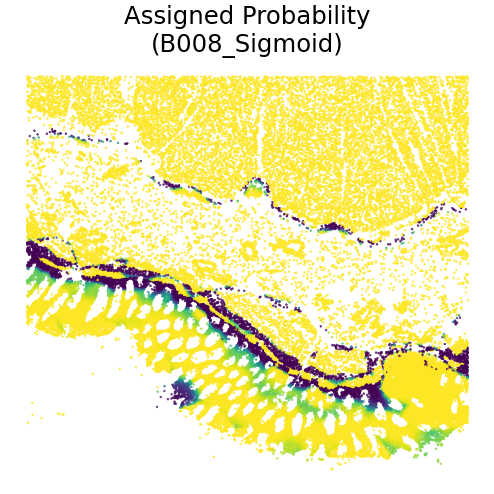

(          Mucosa  Muscularis mucosa      Submucosa  Muscularis externa
 0       0.999396           0.000604  3.563923e-280                 0.0
 1       0.998782           0.001218  5.053508e-284                 0.0
 10      0.243070           0.756930   4.112486e-25                 0.0
 100     0.992165           0.007835   0.000000e+00                 0.0
 1000    0.999780           0.000220  3.706101e-250                 0.0
 ...          ...                ...            ...                 ...
 999995  0.813560           0.186440  3.807604e-159                 0.0
 999996  0.830063           0.169937  1.611086e-131                 0.0
 999997  0.826872           0.173128  4.847809e-165                 0.0
 999998  0.905913           0.094087   3.970979e-22                 0.0
 999999  0.686982           0.313018   4.087767e-76                 0.0
 
 [2512002 rows x 4 columns],
               x       y assigned_tissueunit  assigned_probability  \
 1675661  3613.0  1784.0           

In [36]:
mg.pl.spatial_probability_mapping(
    cells,
    centroids_df,
    cell_type_features = cells.obs[cluster_col].unique(),
    k=300,
    batch_size=20000,
    desired_region="B008_Sigmoid",
)


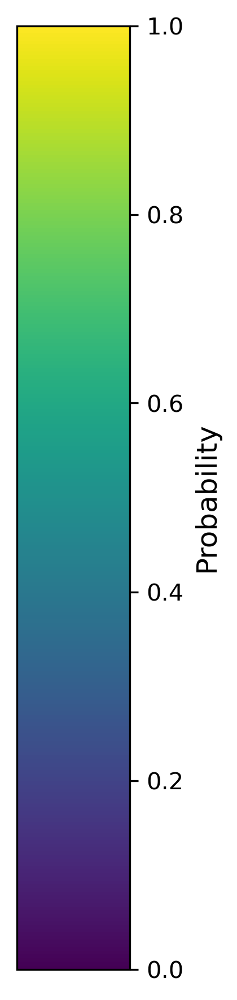

In [44]:
import matplotlib as mpl

# --- Separate Legend Figure ---
fig, ax = plt.subplots(figsize=(1.5, 6), dpi=300)

# Build a scalar mappable for the colorbar
norm = mpl.colors.Normalize(
    vmin=visualization_df['assigned_probability'].min(),
    vmax=visualization_df['assigned_probability'].max()
)
cbar = fig.colorbar(
    mpl.cm.ScalarMappable(norm=norm, cmap='viridis'),
    cax=ax
)

cbar.set_label("Probability", fontsize=12)
plt.tight_layout()
plt.show()

plot j

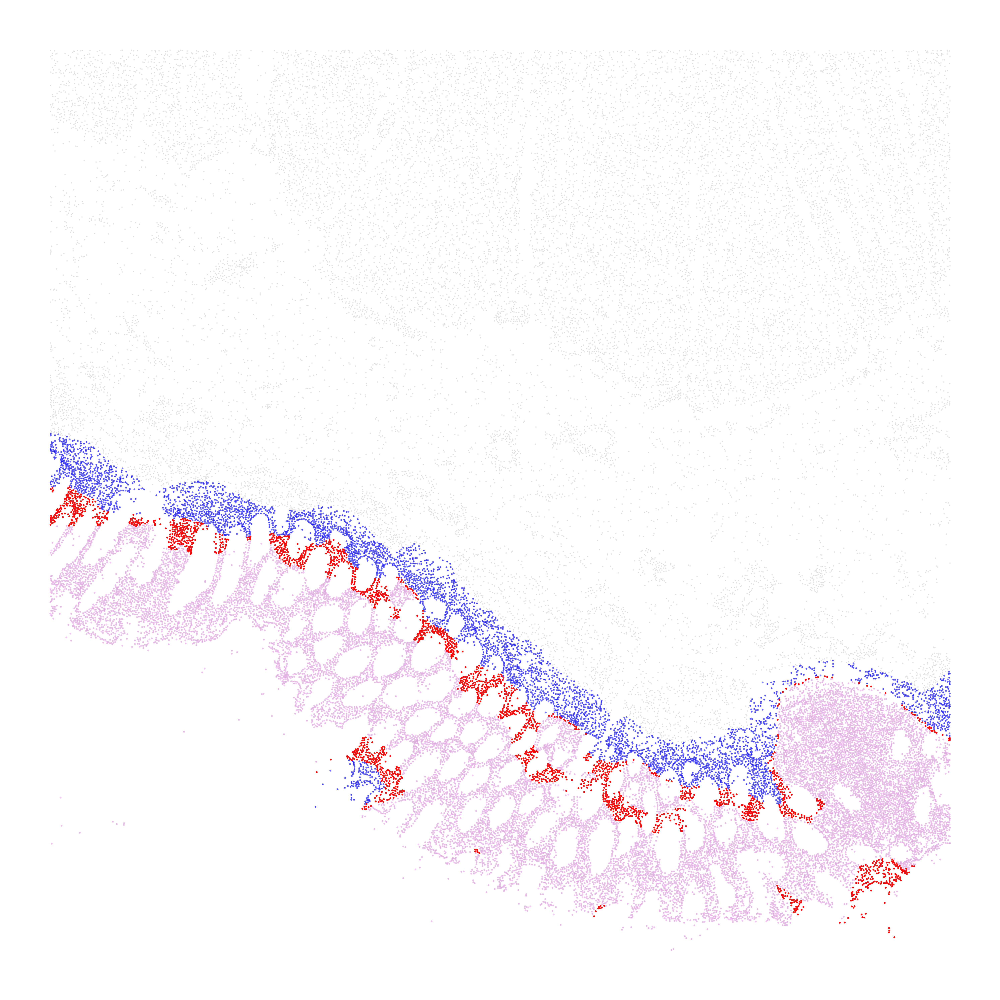

In [42]:
# Choose region and neighborhoods
region = "B008_Sigmoid"
n1, n2 = "Mucosa", "Muscularis mucosa"
threshold = 0.15

# Filter just this region
df_filtered = df_probabilities[df_probabilities['unique_region'] == region]

# Create masks for the neighborhood combination
pos_1 = df_filtered[n1] > threshold
pos_2 = df_filtered[n2] > threshold

mask_only_1 = pos_1 & ~pos_2
mask_only_2 = ~pos_1 & pos_2
mask_both   = pos_1 & pos_2
mask_other  = ~(mask_only_1 | mask_only_2 | mask_both)

# Count border cells
border_count = mask_both.sum()

# --- Plot ---
plt.figure(figsize=(20, 20), dpi=300)

# Background (all other cells in gray)
plt.scatter(df_filtered.loc[mask_other, "x"],
            df_filtered.loc[mask_other, "y"],
            s=1, color="lightgray", alpha=0.5, label="Other cells")

# Neighborhood 1 only
plt.scatter(df_filtered.loc[mask_only_1, "x"],
            df_filtered.loc[mask_only_1, "y"],
            s=3, color="plum", alpha=0.5, label=f"{n1} only")

# Neighborhood 2 only
plt.scatter(df_filtered.loc[mask_only_2, "x"],
            df_filtered.loc[mask_only_2, "y"],
            s=3, color="blue", alpha=0.5, label=f"{n2} only")

# Both neighborhoods (label includes total count)
plt.scatter(df_filtered.loc[mask_both, "x"],
            df_filtered.loc[mask_both, "y"],
            s=3, color="red", alpha=0.9,
            label=f"{n1} + {n2} (n={border_count})")

# Labels and formatting
#plt.title(f"Spatial location in {region}\n{n1} vs {n2}", fontsize=22)
plt.axis("off")
#plt.legend(markerscale=6, fontsize=14, loc="upper right")
plt.tight_layout()
plt.show()

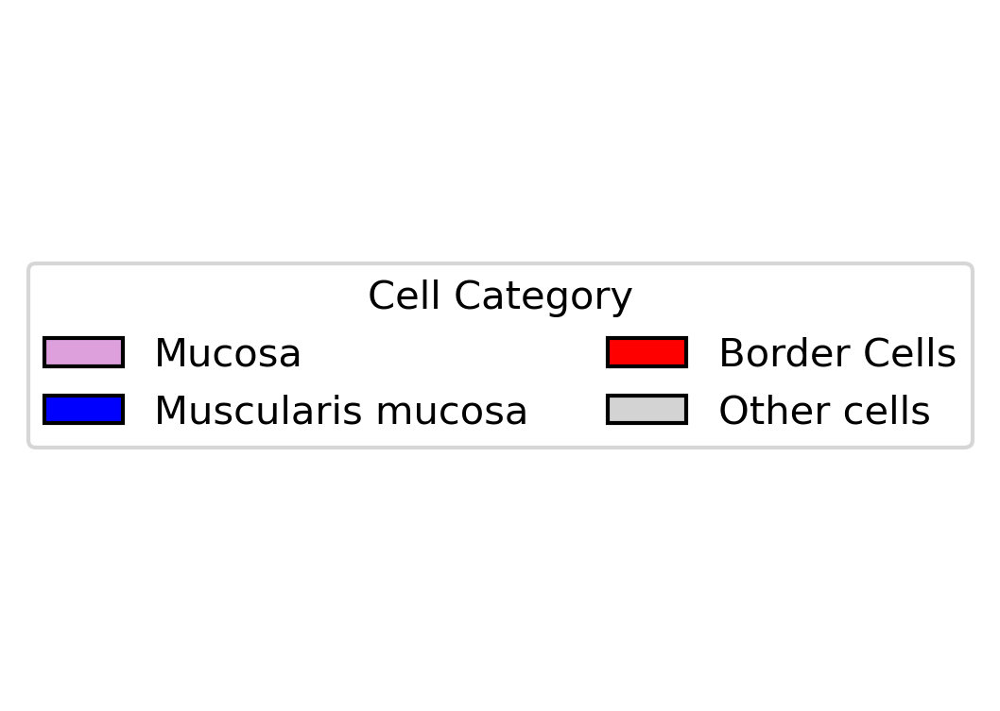

In [43]:
# make a combined legend for the figure panel

# Define the color mapping
custom_legend = {
    "Mucosa": "plum",
    "Muscularis mucosa": "blue",
    "Border Cells": "red",
    "Other cells": "lightgray"
}

# Build legend handles
legend_elements = [
    Patch(facecolor=color, edgecolor="black", label=label)
    for label, color in custom_legend.items()
]

# Create separate legend figure
fig_leg = plt.figure(figsize=(4, 3), dpi=300)
plt.legend(handles=legend_elements, title="Cell Category", loc="center", ncol=2)
plt.axis("off")
plt.show()

k

In [21]:
df_probabilities

,Mucosa,Muscularis mucosa,Submucosa,Muscularis externa
0,9.993961e-01,6.038679e-04,3.563923e-280,0.000000e+00
1,9.987820e-01,1.218045e-03,5.053508e-284,0.000000e+00
2,5.817442e-33,6.174585e-05,9.999383e-01,3.266527e-28
3,9.988328e-01,1.167209e-03,9.967050e-31,0.000000e+00
4,1.000000e+00,8.285584e-11,4.589704e-50,0.000000e+00
...,...,...,...,...
2511997,3.137859e-94,9.158124e-14,5.146858e-11,1.000000e+00
2511998,2.266661e-124,1.398064e-15,1.003787e-13,1.000000e+00
2511999,1.326021e-73,2.755441e-11,8.841544e-07,9.999991e-01
2512000,8.633403e-84,9.249691e-13,2.361350e-09,1.000000e+00


In [22]:
# neighborhoods to compare
N1 = "Muscularis mucosa"
N2 = "Mucosa"

# neighborhoods used ONLY for per-row counting at 0.15
neighborhoods_example = [
    "Mucosa",
    "Muscularis mucosa",
    "Submucosa",
    "Muscularis externa",
]

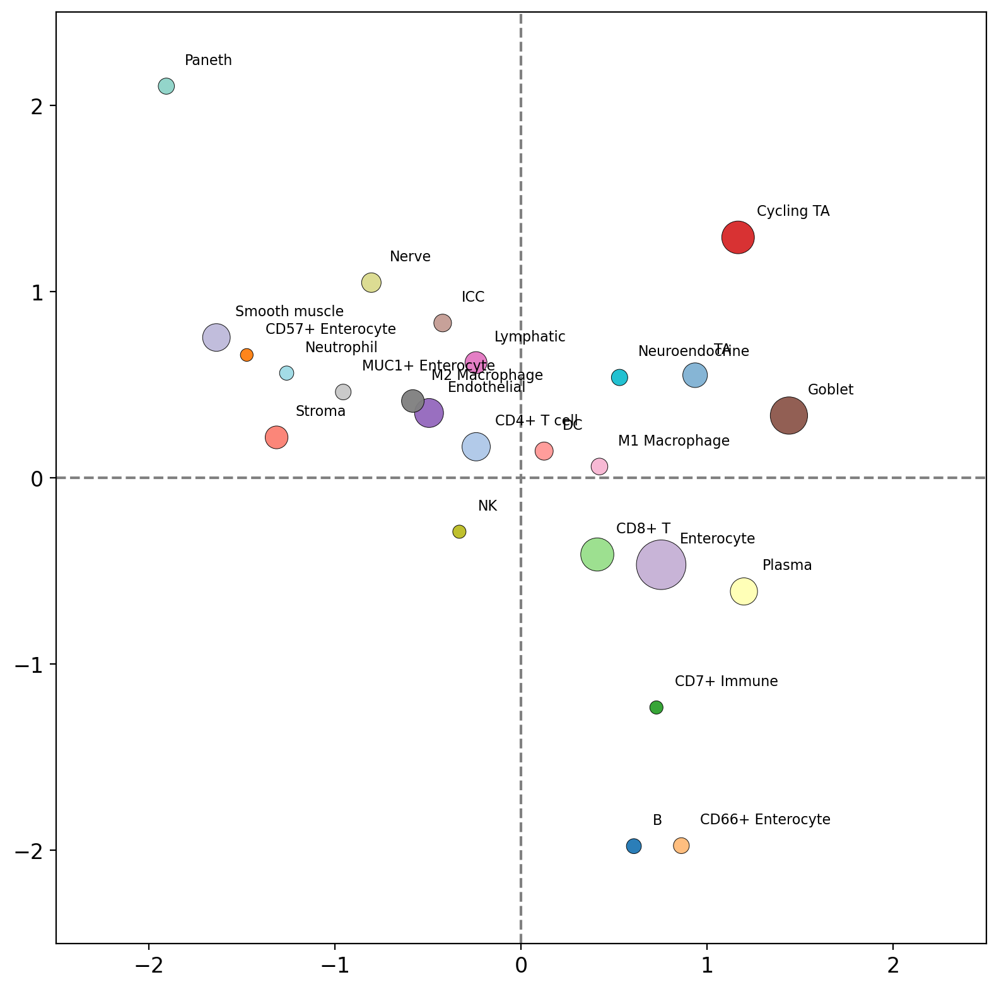

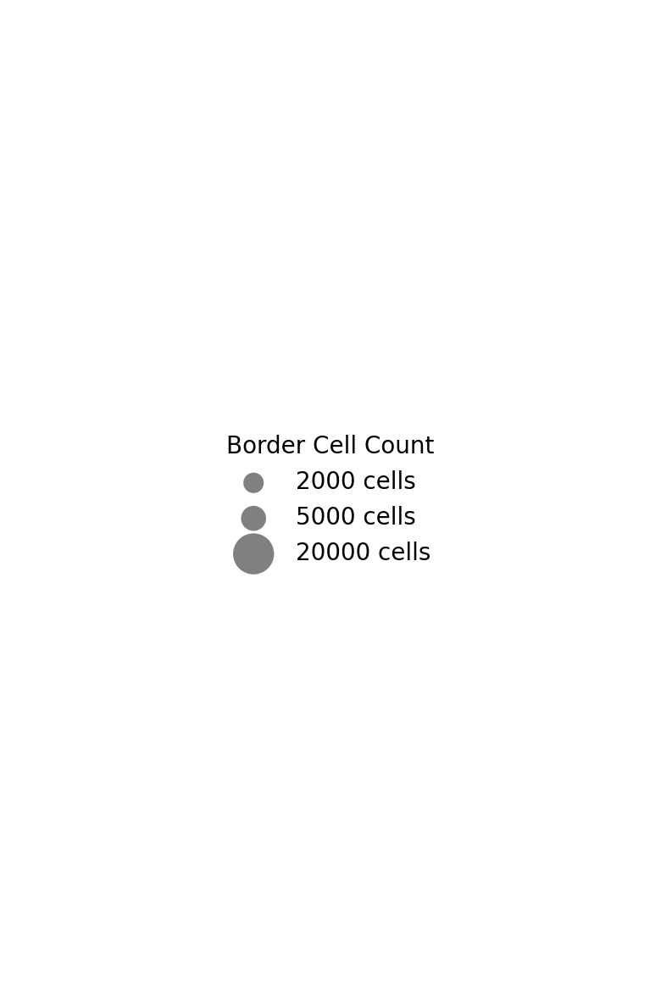

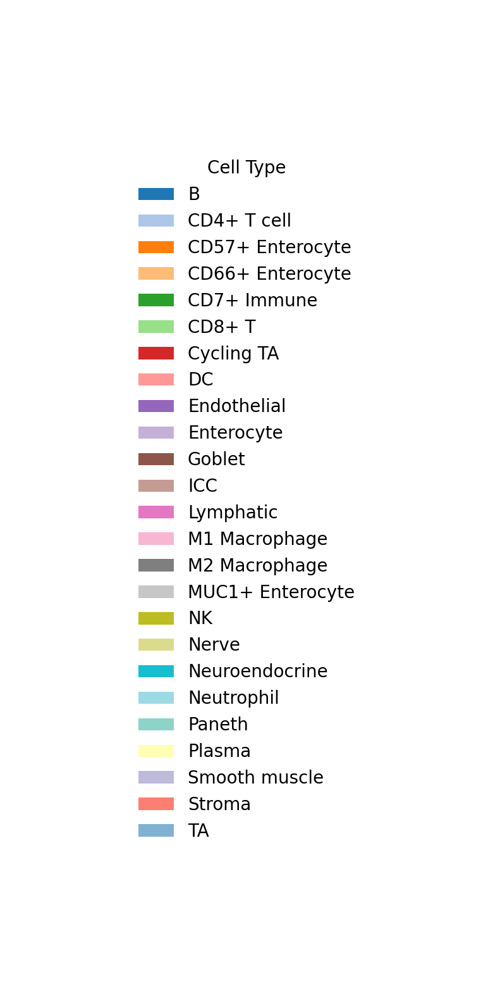

Done. Figures returned: (<Figure size 1600x1600 with 1 Axes>, <Figure size 800x1200 with 1 Axes>, <Figure size 800x1600 with 1 Axes>)


In [29]:
# run plot
figs = mg.pl.plot_border_enrichment(
    adata=cells,
    n1=N1,
    n2=N2,
    cell_type_col="Cell Type",
    pos_threshold=0.25,              # plotting logic
    min_count=5,
    prob_key="neighborhood_probabilities",
    show=True,
    dpi=200,
    label_dots=True,
    label_fontsize=8,
    label_offset_frac=0.02,
    label_bbox=None,
    # neighborhood-count logic (separate from plotting)
    neighborhoods_to_count=neighborhoods_example,
    neighborhood_count_threshold=0.15,
    use_tqdm_for_count=False,         # <-- NO progress bar
)

print("Done. Figures returned:", figs)